# Wasserstein GAN with gradient penalty

In [117]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

import torch
import torchvision
from torch import nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import make_grid

import os
import PIL
from PIL import Image
import pdb
from tqdm.auto import  tqdm



In [2]:
import wandb
wandb.login(key="")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: wichofer89. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /home/luis/.netrc


True

## Utilities functions

In [3]:
#visualization function

def show_images(tensor,num=16, use_wandb=0,name="",step=0):
    """
    tensor = 128 x 784
    """
    data = tensor.detach().cpu()
    
    grid_original = make_grid(data[:num],nrow=int(np.sqrt(num))) # num x 1 x 28 x 28
    grid = grid_original.permute(1, 2, 0) # num x 28 x 28 x 1
    
    if(use_wandb == 1):
        wandb.log({name:wandb.Image(grid.numpy().clip(0,1))},
            step=step)
    
    plt.title(name)
    plt.imshow(grid.clip(0,1))
    plt.show()

In [4]:
# checkpoints
## maybe this functions should be part of the models classes

def save_checkpoint(checkpoint_path, name,epoch):
    torch.save({
        "epoch":epoch,
        "model_state_dict": generator.state_dict(),
        "optimizer_state_dict": generator_optimizer.state_dict()
    },f"{checkpoint_path}G-{name}.pkl")
    
    torch.save({
        "epoch":epoch,
        "model_state_dict": critic.state_dict(),
        "optimizer_state_dict": critic_optimizer.state_dict()
    },f"{checkpoint_path}C-{name}.pkl")
    
    print("saved checkpoint")
    
def load_checkpoint(checkpoint_path, name):
    checkpoint =  torch.load(f"{checkpoint_path}G-{name}.pkl")
    generator.load_state_dict(checkpoint["model_state_dict"])
    generator_optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
    
    checkpoint =  torch.load(f"{checkpoint_path}C-{name}.pkl")
    critic.load_state_dict(checkpoint["model_state_dict"])
    critic_optimizer.load_state_dict(checkpoint["optimizer_state_dict"])

## Parameters and configs

In [56]:
# setup main params and hyper-params

device = "cuda:0"

EPOCHS = 25
LEARNING_RATE = 1e-4
BATCH_SIZE = 512
Z_DIM = 256
CRITIC_CYCLES = 5 #1 generator step for every k critic train step/scycle

show_every = 50
show_ims_every = 50
save_every = show_every # steps for checkpoint saving
wandb_log_freq = 50

wandbact = 1 # track in weights and biases

checkpoints_path = "./checkpoints/"

In [6]:
generator_losses = []
critic_losses = []

In [7]:
experiment_name = wandb.util.generate_id()
wandb_settings = {
    "optimizer":"adam",
    "model":"wgan gp",
    "epoch":EPOCHS,
    "batch_size":BATCH_SIZE
    
}
wandb_run = wandb.init(project = "generative_AI_2023"
                       ,group=experiment_name, config=wandb_settings)
config = wandb.config

print(experiment_name)

cmrpbl40


## Download data and prepare loader
#### Dataset to use: CelebA https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html

Download from https://drive.google.com/file/d/0B7EVK8r0v71pZjFTYXZWM3FlRnM/view?usp=share_link&resourcekey=0-dYn9z10tMJOBAkviAcfdyQ

and extract locally to celeba folder

In [57]:
class Dataset(Dataset):
    def __init__(self, path, im_size=128, limit_size = 10000):
        """
        limit_size: to specify a maximum dataset size
        """
        self.sizes = [im_size,im_size]
        self.items = []
        self.labels = []
        
        for im_name in os.listdir(path)[:limit_size]:
            item = os.path.join(path,im_name)
            self.items.append(item)
            self.labels.append(im_name)
        print(len(os.listdir(path)))
            
        
    def __len__(self):
        return len(self.items)
    
    def __getitem__(self,idx):
        data = PIL.Image.open(self.items[idx]).convert("RGB") # image in original size
        data = np.asarray(torchvision.transforms.Resize(self.sizes)(data))
        data = np.transpose(data, (2,0,1)).astype(np.float32, copy=False) # 3xim_sizexim_size
        data = torch.from_numpy(data).div(255) # from 0 to 1
        return data, self.labels[idx]
    
data_path = "./celeba/img_align_celeba/"
dataset = Dataset(data_path, im_size=128, limit_size = 202000)

dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

202599


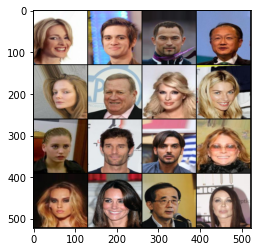

In [9]:
sample_x, sample_y = next(iter(dataloader))

show_images(sample_x)

## Generator

In [10]:
class Generator(nn.Module):
    def __init__(self, z_dim=64, d_dim=16):
        super(Generator, self).__init__()
        self.z_dim  = z_dim
        
        
        self.gen = nn.Sequential(
            
            ## ConvTranspose2d: transpose convolution, kind of reverse convolution to go from low dimensions
            # to high dimensions(upsample) in order to create images from noise gradually
            # we increase image size but decrease number of channels
            ## start with 1x1 image with z_dim channels and end with 128x128 images with 3 channels(rgb)
            nn.ConvTranspose2d(in_channels=z_dim, out_channels=d_dim*32, kernel_size=4, 
                               stride=1, padding=0), ##4x4 (ch:200, 512)
            nn.BatchNorm2d(d_dim*32),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=d_dim*32, out_channels=d_dim*16, kernel_size=4,
                               stride=2, padding= 1), ##8x8 (ch: 512, 256)
            nn.BatchNorm2d(d_dim*16),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=d_dim*16, out_channels=d_dim*8, kernel_size=4,
                              stride=2, padding=1), ## 16x16 (ch: 256,128)
            nn.BatchNorm2d(d_dim*8),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=d_dim*8, out_channels=d_dim*4, kernel_size=4,
                              stride=2, padding=1), ## 32x32 (ch: 128,64)
            nn.BatchNorm2d(d_dim*4),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=d_dim*4, out_channels=d_dim*2, kernel_size=4,
                              stride=2, padding=1), ## 64x64 (ch: 64,32)
            nn.BatchNorm2d(d_dim*2),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=d_dim*2, out_channels=3, kernel_size=4,
                              stride=2, padding=1), ## 128x128 (ch: 32,3), 3 channels for rgb images
            nn.Tanh() ### results to range [-1,1] 
            
            
        )
        
    def forward(self, noise):
        x = noise.view(len(noise), self.z_dim, 1,1)
        
        return self.gen(x)
    

    
def generate_noise(number, z_dim):
    """
    number = number of random vectors
    z_dim = size of every random_vector
    """
    return torch.randn(number, z_dim).to(device)

## Critic

In [11]:
class Critic(nn.Module):
    def __init__(self, d_dim=16):
        super(Critic, self).__init__()
        
        self.critic = nn.Sequential(
            
            ## Conv2d: common convolutions, will decrease dimensions but increase channels
            # input are images output are a scalar 
            nn.Conv2d(in_channels=3, out_channels=d_dim, kernel_size=4, stride=2, padding=1), #64x64 (ch: 3, 16)
            nn.InstanceNorm2d(d_dim),
            nn.LeakyReLU(0.2),
            
            nn.Conv2d(d_dim,d_dim*2, 4,2,1), # 32x32 (ch: 16, 32),
            nn.InstanceNorm2d(d_dim*2),
            nn.LeakyReLU(0.2),
            
            nn.Conv2d(d_dim*2,d_dim*4, 4, 2, 1), #16x16 (ch: 32, 64)
            nn.InstanceNorm2d(d_dim*4),
            nn.LeakyReLU(0.2),
            
            nn.Conv2d(d_dim*4, d_dim*8, 4,2,1), #8*8 ch(64, 128)
            nn.InstanceNorm2d(d_dim*8),
            nn.LeakyReLU(0.2),
            
            nn.Conv2d(d_dim*8, d_dim*16, 4,2,1), #4*4 ch(128, 256)
            nn.InstanceNorm2d(d_dim*16),
            nn.LeakyReLU(0.2),
            
            nn.Conv2d(d_dim*16, 1, 4,1,0) #1*1 ch(256, 1)
        )
        
    def forward(self, image):
        """
        image: batch_sizex3x128x128
        """
        critic_prediction = self.critic(image) #batch_size x 1 x 1 x1
        return critic_prediction.view(len(critic_prediction), -1) #batch_sizex1

## Define models and optimizers

In [12]:
generator = Generator(z_dim=Z_DIM).to(device)
critic = Critic().to(device)

In [13]:
generator

Generator(
  (gen): Sequential(
    (0): ConvTranspose2d(256, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (13): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats

In [14]:
critic

Critic(
  (critic): Sequential(
    (0): Conv2d(3, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): InstanceNorm2d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (5): LeakyReLU(negative_slope=0.2)
    (6): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (8): LeakyReLU(negative_slope=0.2)
    (9): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (11): LeakyReLU(negative_slope=0.2)
    (12): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (13): InstanceNorm2d(256, eps=1e-05, momentum=0.1, 

In [15]:
generator_optimizer = torch.optim.Adam(generator.parameters(), lr = LEARNING_RATE, betas=(0.5,0.9))
critic_optimizer = torch.optim.Adam(critic.parameters(), lr = LEARNING_RATE, betas = (0.5,0.9))

In [16]:
if (wandbact == 1):
    wandb.watch(generator, log_freq=wandb_log_freq)
    wandb.watch(critic, log_freq=wandb_log_freq)

### Gradient penalty

In [17]:
def calc_gp(real, fake, critic, alpha, gamma=10):
    """
    alpha: weight real vs fake in interpolation(randomly)
    gamma: regularization coefficient
    """
    im_interpolation = real * alpha + fake*(1-alpha) #batch_size x 3x128x128
    interpolation_scores = critic(im_interpolation)
    
    gradient = torch.autograd.grad(
        inputs = im_interpolation,
        outputs = interpolation_scores,
        grad_outputs = torch.ones_like(interpolation_scores),
        retain_graph = True,
        create_graph=True
    )[0] # batch_sizex3x128x128
    
    gradient = gradient.view(len(gradient), -1) #batch_size x 49152
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = gamma*((gradient_norm - 1)**2).mean()
    
    return gradient_penalty

## Training Loop

  0%|          | 0/395 [00:00<?, ?it/s]

Epoch:195 step:140900 gen loss:-87.6466522216796875 critic loss: -0.7227


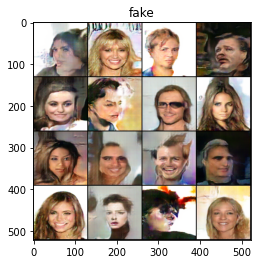

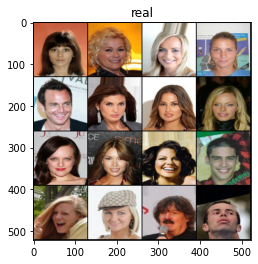

Saving checkpont:140900
saved checkpoint
Epoch:195 step:140950 gen loss:-81.26679229736328125 critic loss: -0.8482


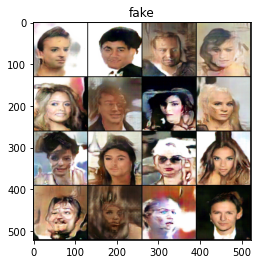

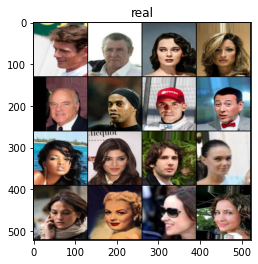

Saving checkpont:140950
saved checkpoint
Epoch:195 step:141000 gen loss:-80.91129302978515625 critic loss: -0.8379


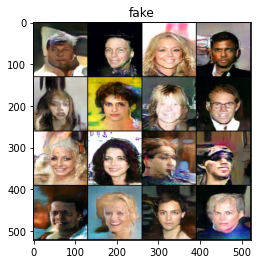

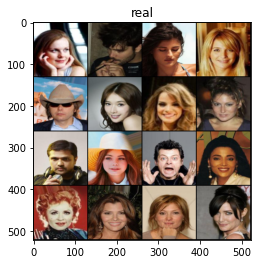

Saving checkpont:141000
saved checkpoint
Epoch:195 step:141050 gen loss:-87.4691619873046875 critic loss: -0.7509


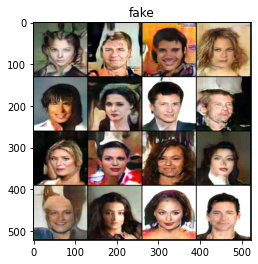

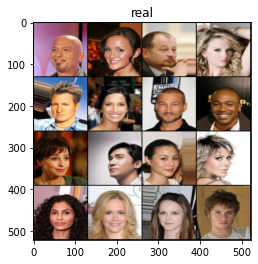

Saving checkpont:141050
saved checkpoint
Epoch:195 step:141100 gen loss:-78.5413360595703125 critic loss: -0.3793


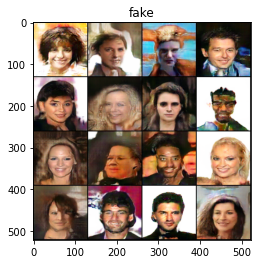

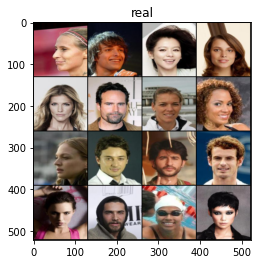

Saving checkpont:141100
saved checkpoint
Epoch:195 step:141150 gen loss:-80.8469390869140625 critic loss: -0.7145


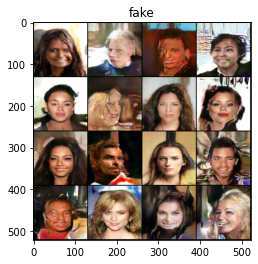

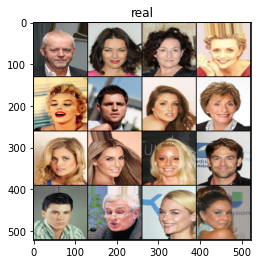

Saving checkpont:141150
saved checkpoint
Epoch:195 step:141200 gen loss:-85.5181427001953125 critic loss: -0.7352


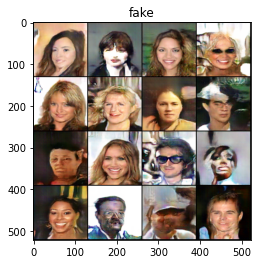

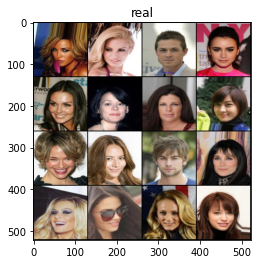

Saving checkpont:141200
saved checkpoint
Epoch:195 step:141250 gen loss:-84.40000152587890625 critic loss: -0.7387


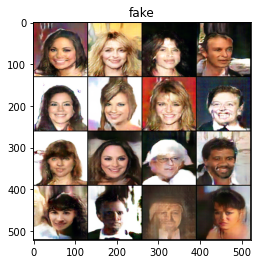

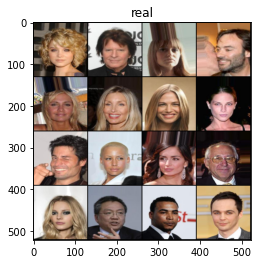

Saving checkpont:141250
saved checkpoint


  0%|          | 0/395 [00:00<?, ?it/s]

Epoch:196 step:141300 gen loss:-82.07555389404296875 critic loss: -0.7415


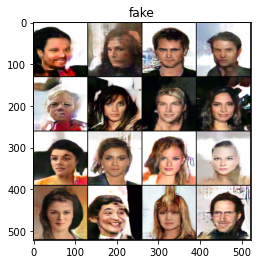

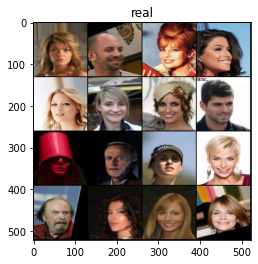

Saving checkpont:141300
saved checkpoint
Epoch:196 step:141350 gen loss:-79.12056732177734375 critic loss: -0.5862


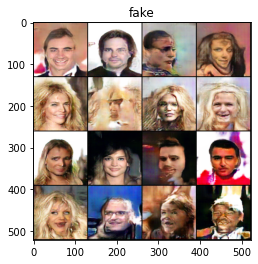

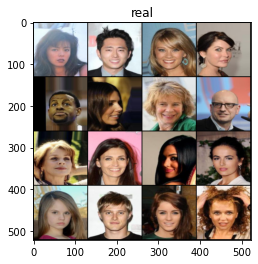

Saving checkpont:141350
saved checkpoint
Epoch:196 step:141400 gen loss:-77.44004058837890625 critic loss: -0.9319


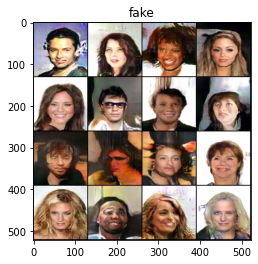

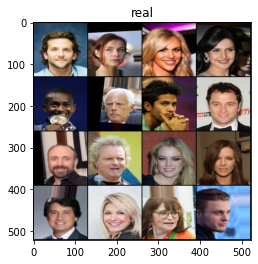

Saving checkpont:141400
saved checkpoint
Epoch:196 step:141450 gen loss:-81.80591583251953125 critic loss: -0.7633


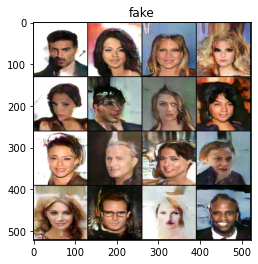

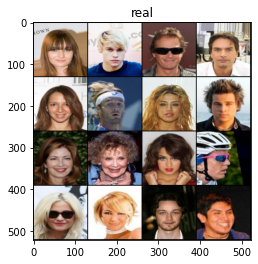

Saving checkpont:141450
saved checkpoint
Epoch:196 step:141500 gen loss:-79.4915008544921875 critic loss: -0.8471


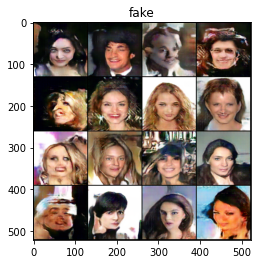

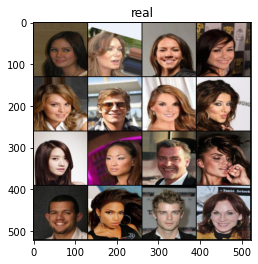

Saving checkpont:141500
saved checkpoint
Epoch:196 step:141550 gen loss:-81.16794586181640625 critic loss: -0.6715


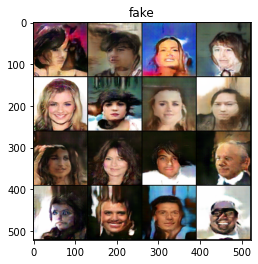

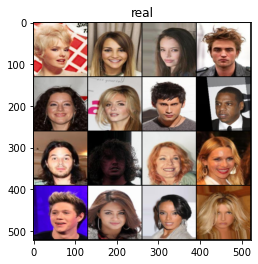

Saving checkpont:141550
saved checkpoint
Epoch:196 step:141600 gen loss:-86.203521728515625 critic loss: -0.7967


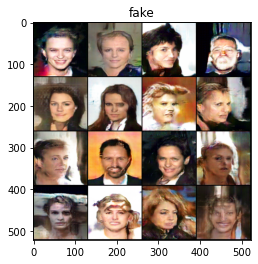

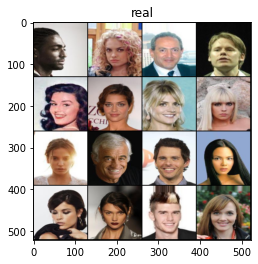

Saving checkpont:141600
saved checkpoint
Epoch:196 step:141650 gen loss:-85.144256591796875 critic loss: -0.7134


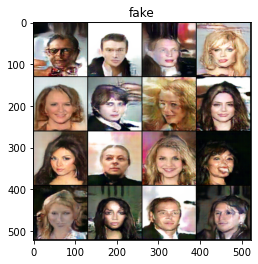

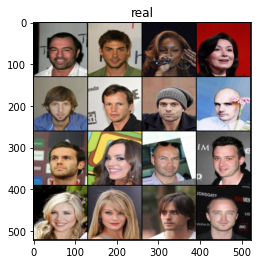

Saving checkpont:141650
saved checkpoint


  0%|          | 0/395 [00:00<?, ?it/s]

Epoch:197 step:141700 gen loss:-83.01924896240234375 critic loss: -1.0612


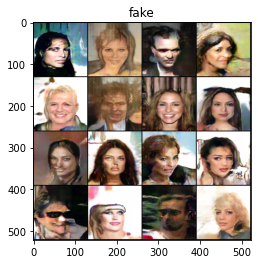

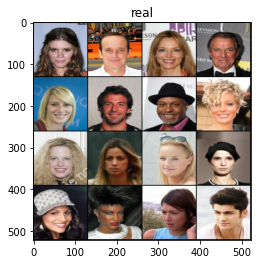

Saving checkpont:141700
saved checkpoint
Epoch:197 step:141750 gen loss:-81.9514923095703125 critic loss: -0.7641


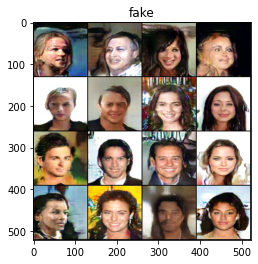

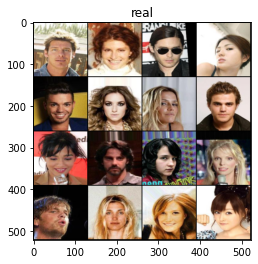

Saving checkpont:141750
saved checkpoint
Epoch:197 step:141800 gen loss:-81.399505615234375 critic loss: -0.7389


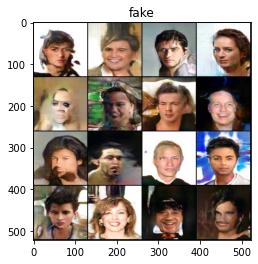

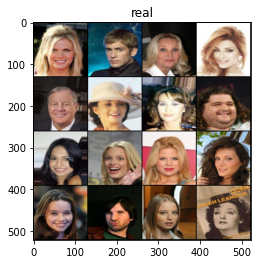

Saving checkpont:141800
saved checkpoint
Epoch:197 step:141850 gen loss:-78.4027557373046875 critic loss: -0.9542


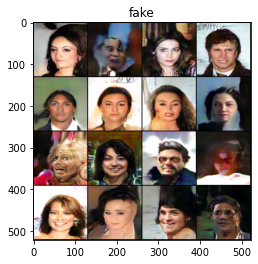

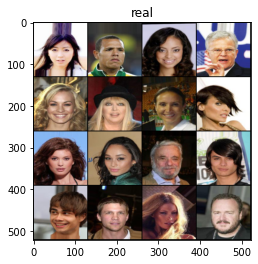

Saving checkpont:141850
saved checkpoint
Epoch:197 step:141900 gen loss:-82.30027008056640625 critic loss: -0.7984


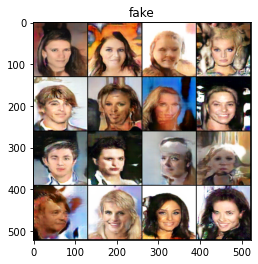

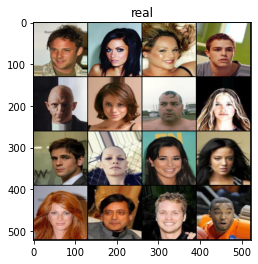

Saving checkpont:141900
saved checkpoint
Epoch:197 step:141950 gen loss:-82.980377197265625 critic loss: -0.7495


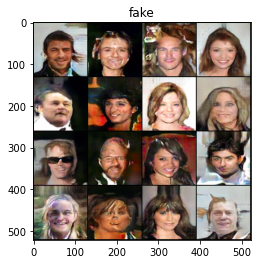

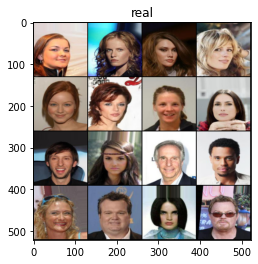

Saving checkpont:141950
saved checkpoint
Epoch:197 step:142000 gen loss:-83.20609283447265625 critic loss: -0.9063


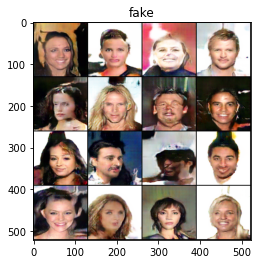

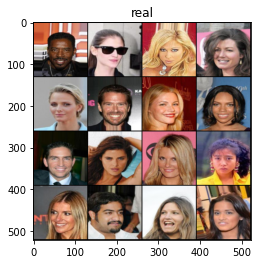

Saving checkpont:142000
saved checkpoint
Epoch:197 step:142050 gen loss:-82.1356658935546875 critic loss: -0.7019


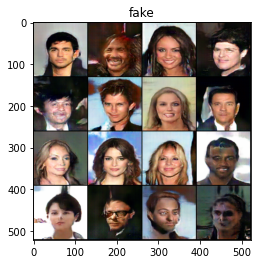

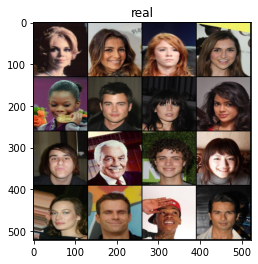

Saving checkpont:142050
saved checkpoint


  0%|          | 0/395 [00:00<?, ?it/s]

Epoch:198 step:142100 gen loss:-80.77227783203125 critic loss: -0.4056


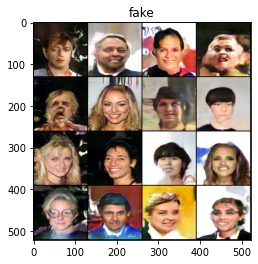

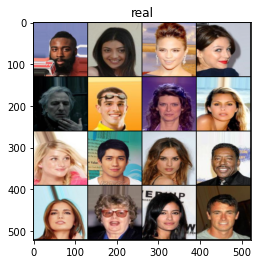

Saving checkpont:142100
saved checkpoint
Epoch:198 step:142150 gen loss:-84.01853179931640625 critic loss: -0.7891


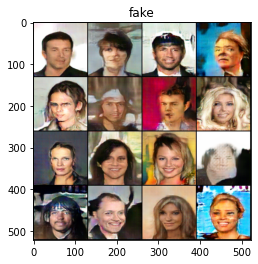

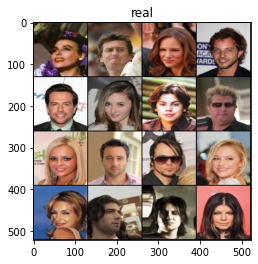

Saving checkpont:142150
saved checkpoint
Epoch:198 step:142200 gen loss:-83.91596221923828125 critic loss: -0.8124


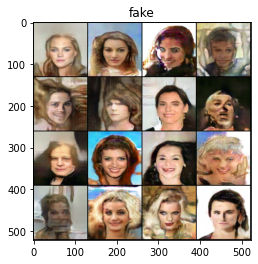

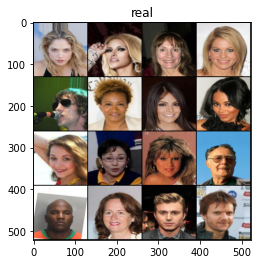

Saving checkpont:142200
saved checkpoint
Epoch:198 step:142250 gen loss:-83.9640960693359375 critic loss: -0.5604


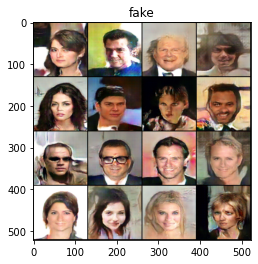

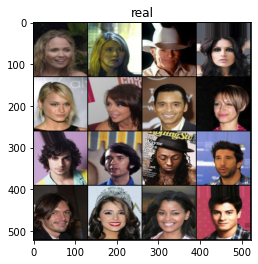

Saving checkpont:142250
saved checkpoint
Epoch:198 step:142300 gen loss:-80.3352813720703125 critic loss: -0.7908


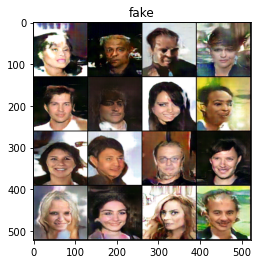

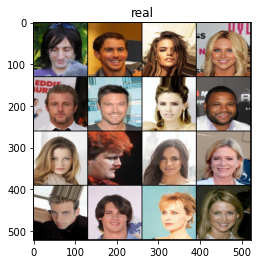

Saving checkpont:142300
saved checkpoint
Epoch:198 step:142350 gen loss:-86.0108489990234375 critic loss: -0.7320


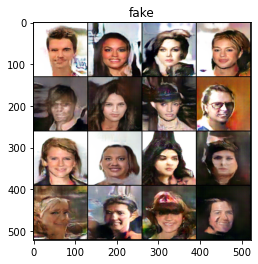

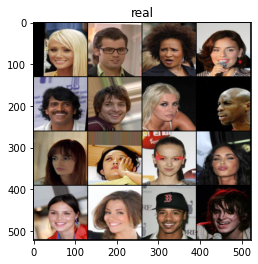

Saving checkpont:142350
saved checkpoint
Epoch:198 step:142400 gen loss:-79.709197998046875 critic loss: -0.7652


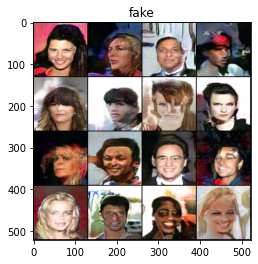

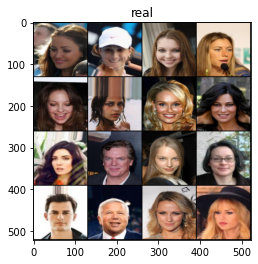

Saving checkpont:142400
saved checkpoint
Epoch:198 step:142450 gen loss:-85.2947235107421875 critic loss: -0.8794


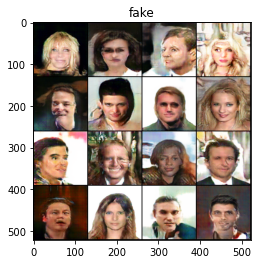

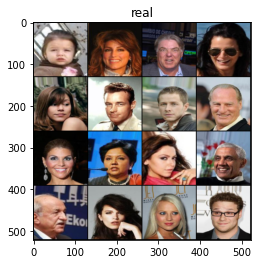

Saving checkpont:142450
saved checkpoint


  0%|          | 0/395 [00:00<?, ?it/s]

Epoch:199 step:142500 gen loss:-82.53179168701171875 critic loss: -0.7132


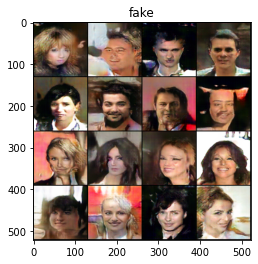

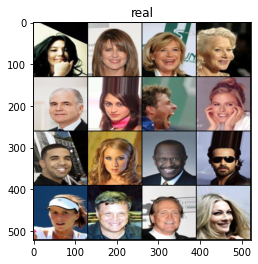

Saving checkpont:142500
saved checkpoint
Epoch:199 step:142550 gen loss:-78.7061614990234375 critic loss: -0.5970


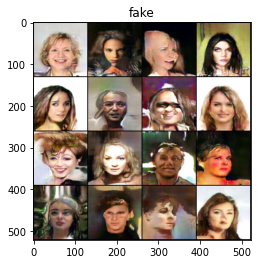

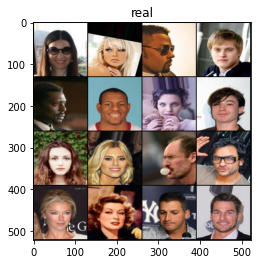

Saving checkpont:142550
saved checkpoint
Epoch:199 step:142600 gen loss:-82.93698883056640625 critic loss: -0.7204


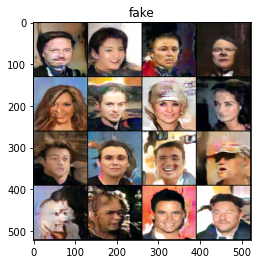

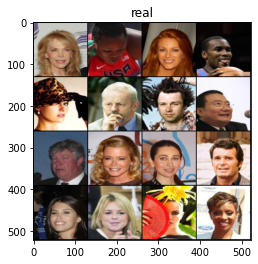

Saving checkpont:142600
saved checkpoint
Epoch:199 step:142650 gen loss:-80.97354888916015625 critic loss: -0.8944


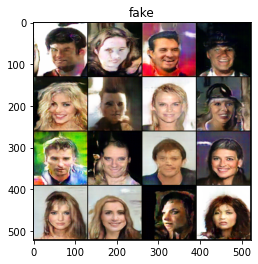

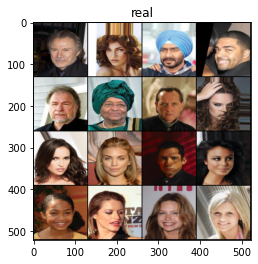

Saving checkpont:142650
saved checkpoint
Epoch:199 step:142700 gen loss:-76.66974639892578125 critic loss: -0.3887


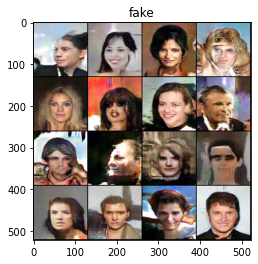

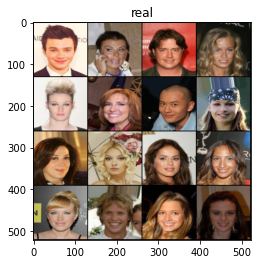

Saving checkpont:142700
saved checkpoint
Epoch:199 step:142750 gen loss:-78.143951416015625 critic loss: -0.6164


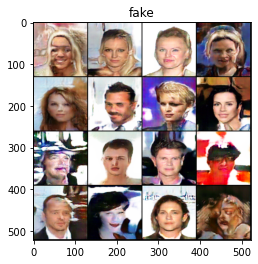

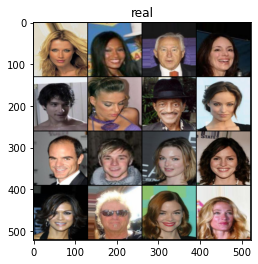

Saving checkpont:142750
saved checkpoint
Epoch:199 step:142800 gen loss:-86.15594482421875 critic loss: -0.8470


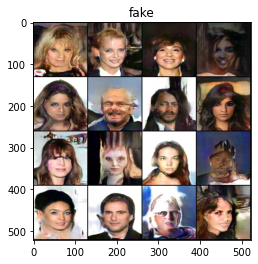

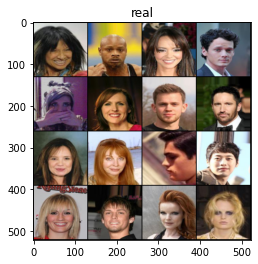

Saving checkpont:142800
saved checkpoint
Epoch:199 step:142850 gen loss:-84.9330902099609375 critic loss: -0.7270


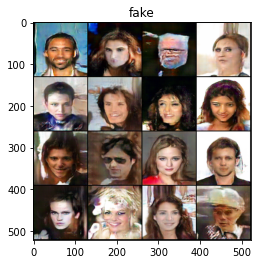

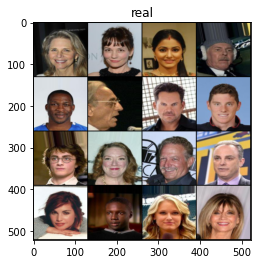

Saving checkpont:142850
saved checkpoint


  0%|          | 0/395 [00:00<?, ?it/s]

Epoch:200 step:142900 gen loss:-80.0152740478515625 critic loss: -0.6825


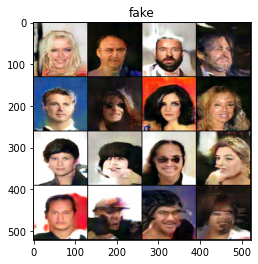

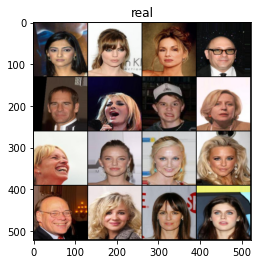

Saving checkpont:142900
saved checkpoint
Epoch:200 step:142950 gen loss:-81.9952392578125 critic loss: -0.8074


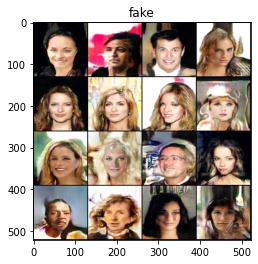

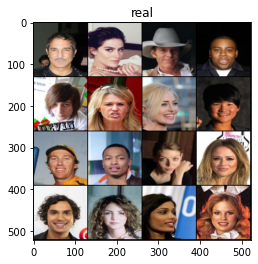

Saving checkpont:142950
saved checkpoint
Epoch:200 step:143000 gen loss:-82.695404052734375 critic loss: -0.6829


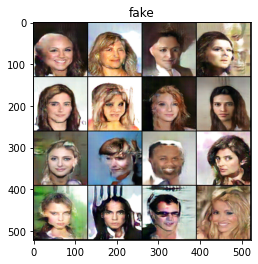

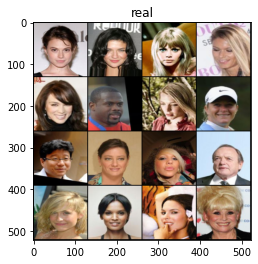

Saving checkpont:143000
saved checkpoint
Epoch:200 step:143050 gen loss:-74.6905670166015625 critic loss: -0.3640


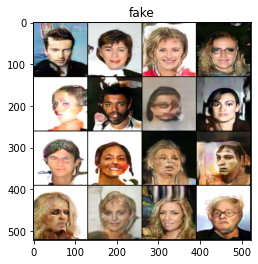

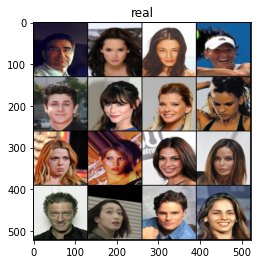

Saving checkpont:143050
saved checkpoint
Epoch:200 step:143100 gen loss:-79.84610748291015625 critic loss: -0.5909


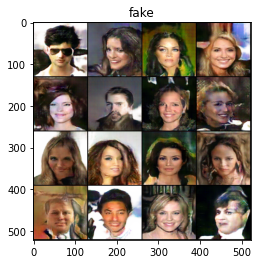

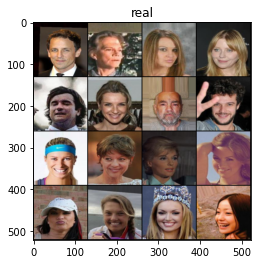

Saving checkpont:143100
saved checkpoint
Epoch:200 step:143150 gen loss:-80.3291473388671875 critic loss: -0.5455


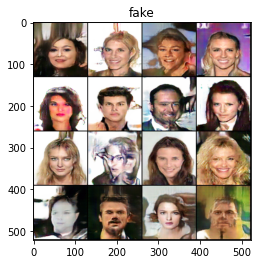

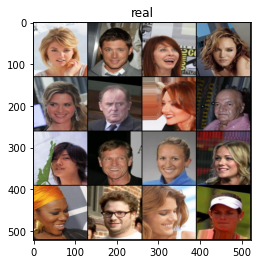

Saving checkpont:143150
saved checkpoint
Epoch:200 step:143200 gen loss:-77.55768585205078125 critic loss: -0.9596


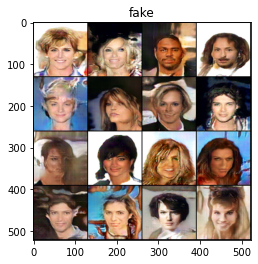

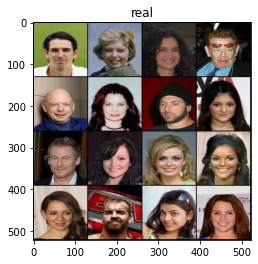

Saving checkpont:143200
saved checkpoint
Epoch:200 step:143250 gen loss:-79.555908203125 critic loss: -0.5295


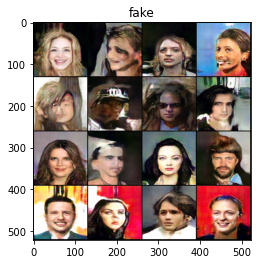

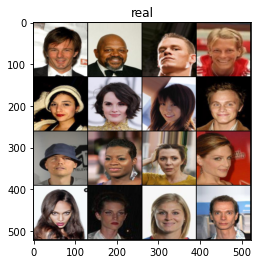

Saving checkpont:143250
saved checkpoint


In [76]:
#current_step = 1

for epoch in range(195,201):
    for real_ims, _ in tqdm(dataloader):
        real_ims = real_ims.to(device)
        current_size = len(real_ims)
        
        # TRAIN CRITIC(multiple critic cycles for every generator cycle)
        mean_critic_loss = 0 # for every batch the critic loss is the mean across cycles
        for cycle in range(CRITIC_CYCLES):
            critic_optimizer.zero_grad()
            
            noise = generate_noise(current_size, Z_DIM)
            fake_ims = generator(noise)
            critic_fake_predictions = critic(fake_ims.detach()) # so no gradients are calculated for generator
            critic_real_predictions = critic(real_ims)
            
            alpha = torch.rand(len(real_ims),1,1,1, device= device, requires_grad= True) # batch_sizex1x1x1
            gradient_penalty = calc_gp(real=real_ims,fake=fake_ims,critic=critic,alpha=alpha)
            
            critic_loss = critic_fake_predictions.mean() - critic_real_predictions.mean() + gradient_penalty
            
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()
            
            mean_critic_loss+=critic_loss.item() #acumulate the critic loss
        mean_critic_loss=mean_critic_loss/CRITIC_CYCLES
        
        # append the loss from the last cicle
        critic_losses.append(mean_critic_loss)
            
        # TRAIN GENERATOR
        generator_optimizer.zero_grad()
        noise = generate_noise(current_size, Z_DIM)
        fake_ims = generator(noise)
        critic_fake_predictions = critic(fake_ims)
        
        # maximize the score is the same as minimize the negative of it
        generator_loss = -critic_fake_predictions.mean()
        generator_loss.backward()
        generator_optimizer.step()
        
        generator_losses.append(generator_loss.item())
        
        
        if current_step > 0 and current_step % show_every == 0:            
            print(f"Epoch:{epoch} step:{current_step} gen loss:{generator_loss.item():.24} critic loss: {critic_loss.item():.4f}" )
            
        if wandbact == 1:
            wandb.log({
                "Epoch": epoch, 
                "Step": current_step,
                "Critic loss":mean_critic_loss,
                "Generator Loss":generator_loss.item(),
                "Critic gradient penalty": gradient_penalty.item()
            },
            step=current_step
            )
            
        if  current_step > 0 and current_step % show_ims_every == 0:
            
            #plt.plot(gen_losses)
            #plt.plot(disc_losses)
            
            show_images(fake_ims,use_wandb=wandbact,name="fake",step=current_step)
            show_images(real_ims,use_wandb=wandbact,name="real",step=current_step)
            
            plt.show()
            
        
            
        if current_step % save_every == 0 and current_step > 1:
            print(f"Saving checkpont:{current_step}")
            save_checkpoint(checkpoint_path=checkpoints_path, name="latest_checkpoint",epoch=epoch)
            
        current_step+=1
        
    
    

In [71]:
BATCH_SIZE

512

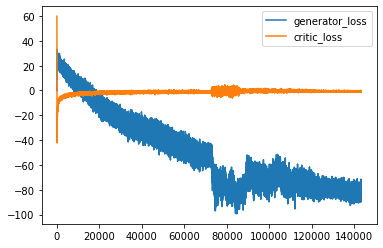

In [137]:
plt.plot(generator_losses,label="generator_loss")
plt.plot(critic_losses,label="critic_loss")
plt.legend()
plt.show()

#### Note about monitoring losses

GANs evaluation metrics are not so simple to interpret, let the training run for a couple of epochs before analyzing the process since the first iterations will be unstable with no clear trend.

After some epochs start monitoring both the generated images quality and the evaluation metrics to follow a convergence trend, however it can increase or decrease, the important part is to identify a convergence trend where both generator and discriminator show convergence to a value(not the same for them)

## Test

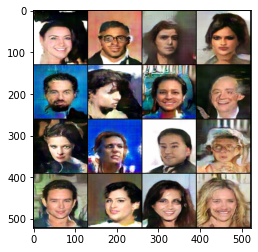

In [100]:
noise = generate_noise(BATCH_SIZE,Z_DIM)
fake = generator(noise)
show_images(fake)

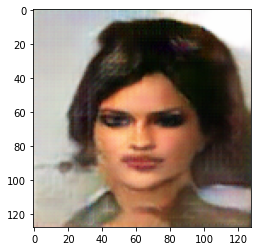

In [101]:
plt.imshow(fake[3].detach().cpu().permute(1,2,0).squeeze().clip(0,1))
plt.show()

### Morphing :interpolation between points in the latent space space

Sample 2 points in the latent space and see the "path" from one face to the other.

In [127]:
z_shape = [1,Z_DIM,1,1] # batch size, Z_DIM, 1,1
rows = 8
steps = 12 # images between one image and another

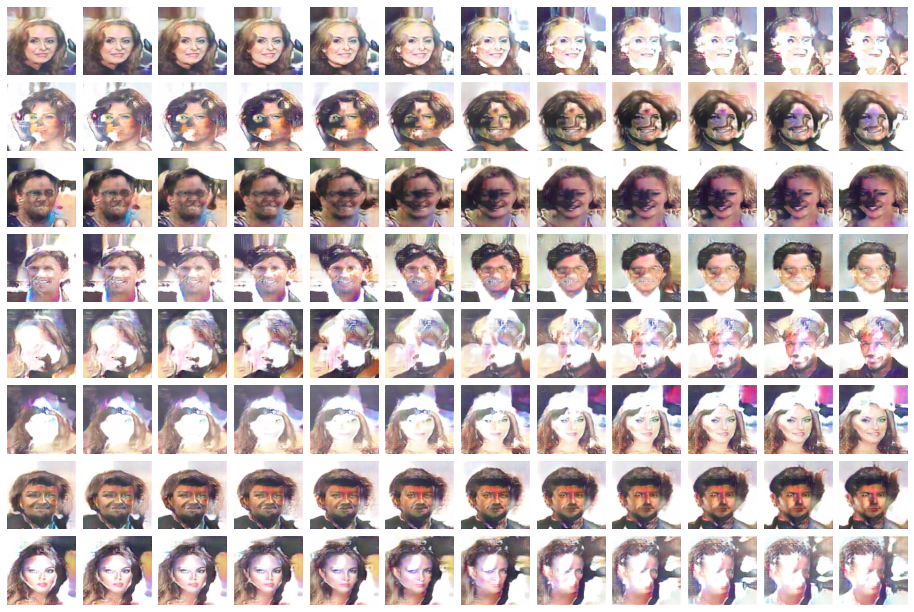

In [136]:
gen_set = [] # store the results(interpolated images)

for i in range(rows):
    
    z1 = torch.randn(z_shape)
    z2 = torch.randn(z_shape)
    
    for alpha in np.linspace(0,1, steps):
        z = alpha*z1 + (1-alpha)*z2
        new_im = generator(z.cuda())[0]
        gen_set.append(new_im)
        
fig = plt.figure(figsize=(25,11))
grid = ImageGrid(fig, 111, nrows_ncols=(rows,steps),axes_pad=0.1)

for ax, img in zip(grid, gen_set):
    ax.axis("off")
    result = img.cpu().detach().permute(1,2,0)
    result = (result - result.min())/((result.max()-result.min()))
    
    ax.imshow(result)
    
plt.show()
